<a href="https://colab.research.google.com/github/alheir/dip-2024-g4/blob/main/DIP_TP5_G4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TP5 Procesamiento de Imágenes - Grupo 4

Heir, Alejandro Nahuel (62496)

Mendizabal, Francisco (61454)

Sbruzzi, Juan Francisco (62517)

Vazquez, Agustin (61420)

# Consignas

**Restauración de Imágenes**

Trabajo de Investigación

Escribir ejemplos en Python para cada uno de los siguientes casos
1. Inverse Filtering: a) Blur. b) Blur+Noise
2. Wiener Blur + Noise
3. Blind Deconvolution
4. Motion Blur
5. Regularizacion y metodos iterativos

Comparar resultados con MSE

Eliminar interferencia de la imagen `clown.jpg`


# Paquetes y módulos

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import imageio.v3 as iio
import cv2
from scipy.signal import convolve2d

# Carga de imágenes

In [2]:
imgzip_fn = 'tp5-images.zip'
imgzip_url = 'https://downloads.sourceforge.net/project/dsp-fpga-dip-nn-itba/dip/tp5-images.zip'

!wget {imgzip_url} -O {imgzip_fn}

!unzip -o {imgzip_fn}

!rm {imgzip_fn}

--2024-10-20 04:51:15--  https://downloads.sourceforge.net/project/dsp-fpga-dip-nn-itba/dip/tp5-images.zip
Resolving downloads.sourceforge.net (downloads.sourceforge.net)... 204.68.111.105
Connecting to downloads.sourceforge.net (downloads.sourceforge.net)|204.68.111.105|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://master.dl.sourceforge.net/project/dsp-fpga-dip-nn-itba/dip/tp5-images.zip?viasf=1 [following]
--2024-10-20 04:51:15--  https://master.dl.sourceforge.net/project/dsp-fpga-dip-nn-itba/dip/tp5-images.zip?viasf=1
Resolving master.dl.sourceforge.net (master.dl.sourceforge.net)... 216.105.38.12
Connecting to master.dl.sourceforge.net (master.dl.sourceforge.net)|216.105.38.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 165157 (161K) [application/octet-stream]
Saving to: ‘tp5-images.zip’

tp5-images.zip      100%[===================>] 161.29K  --.-KB/s    in 0.04s   

2024-10-20 04:51:15 (4.31 MB/s) - ‘tp5-image

# 1 - Inverse Filtering

El filtrado inverso es una técnica simple que divide la transformada de Fourier de la imagen degradada por la función de transferencia de degradación del filtro causante del desenfoque. En teoría, debería recuperar la imagen original. Sin embargo, la presencia de ruido en la imagen degradada puede amplificar el problema y generar resultados indeseables.

Sea $\hat{F}(u,v)$ la estimación de la transformada de Fourier de la imagen original, $G(u,v)$ la transformada de la imagen degradada, $H(u,v)$ la función transferencia de degradación (DTF), $N(u,v)$ la transformada de ruido desconocido:
$$\hat{F}(u,v) = \frac{G(u,v)}{H(u,v)} = F(u,v) + \frac{N(u,v)}{H(u,v)}$$

* Si la imagen original no es contaminada por ruido, es decir, $N = 0$, el filtrado inverso restaura completamente la imagen original, siempre que se disponga conocimiento de $H$.

*Referencias: Gonzalez&Woods, 5 Image Restoration and Reconstruction*

## a) Blur

In [3]:
def apply_fft_kernel(image_fft, kernel_fft):
  image_fft = np.fft.fftshift(image_fft)
  kernel_fft = np.fft.fftshift(kernel_fft)
  return np.fft.fftshift(kernel_fft * image_fft)

def blur_image(image, kernel_size):
  kernel = np.ones((kernel_size, kernel_size)) / (kernel_size * kernel_size)
  kernel_fft = np.fft.fft2(kernel, s=image.shape)

  image_fft = np.fft.fft2(image)

  blurred_image_fft = apply_fft_kernel(image_fft, kernel_fft)

  return np.fft.ifft2(blurred_image_fft).real

def calculate_inverse_filter(blurred_image, kernel_size):
  threshold = 1e-5

  kernel = np.ones((kernel_size, kernel_size)) / (kernel_size * kernel_size)
  kernel_fft = np.fft.fft2(kernel, s=blurred_image.shape)
  blurred_image_fft = np.fft.fft2(blurred_image)

  inverse_filter_fft = 1 / (kernel_fft + threshold) # F' = G / H

  return inverse_filter_fft

def apply_inverse_filter(blurred_image, inverse_filter_fft):
  blurred_image_fft = np.fft.fft2(blurred_image)
  restored_image_fft = apply_fft_kernel(blurred_image_fft, inverse_filter_fft)
  restored_image = np.fft.ifft2(restored_image_fft).real
  return restored_image

In [4]:
image = iio.imread('lena.png')

kernel_size = 9
kernel = np.ones((kernel_size, kernel_size)) / (kernel_size * kernel_size)
kernel_fft = np.fft.fft2(kernel, s=image.shape)

blurred_image1 = blur_image(image, kernel_size)

inverse_filter_fft1 = calculate_inverse_filter(blurred_image1, kernel_size)

restored_image1a = apply_inverse_filter(blurred_image1, inverse_filter_fft1)

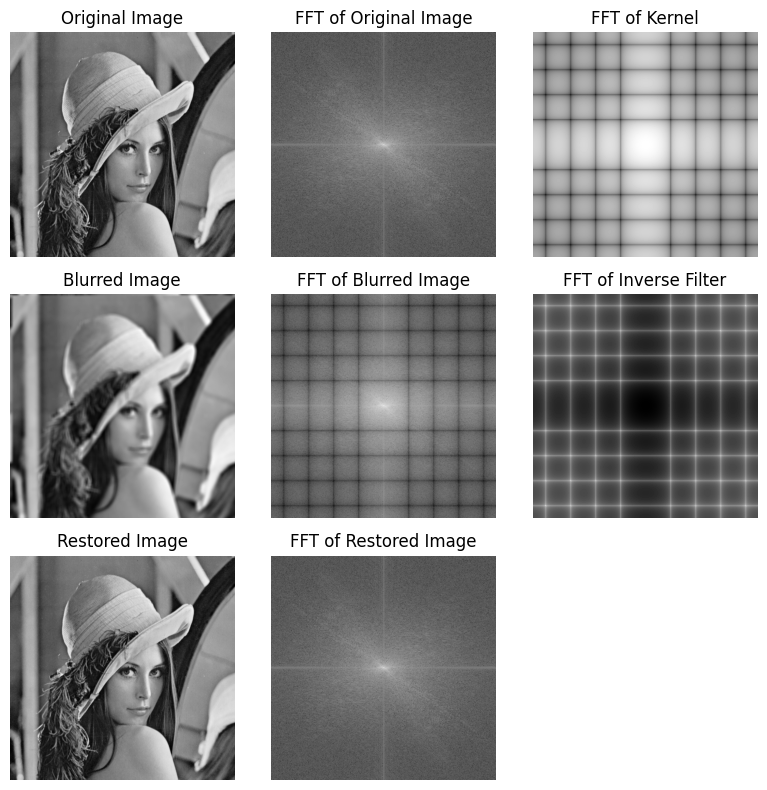

In [5]:
fig, axs = plt.subplots(3, 3, figsize=(8, 8))

# original
axs[0, 0].imshow(image, cmap='gray')
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

image_fft = np.fft.fft2(image)
axs[0, 1].imshow(np.log(np.abs(np.fft.fftshift(image_fft))), cmap='gray')
axs[0, 1].set_title('FFT of Original Image')
axs[0, 1].axis('off')


# blurred
axs[1, 0].imshow(blurred_image1, cmap='gray')
axs[1, 0].set_title('Blurred Image')
axs[1, 0].axis('off')

blurred_image_fft1 = np.fft.fft2(blurred_image1)
axs[1, 1].imshow(np.log(np.abs(np.fft.fftshift(blurred_image_fft1))), cmap='gray')
axs[1, 1].set_title('FFT of Blurred Image')
axs[1, 1].axis('off')


# restored
axs[2, 0].imshow(restored_image1a, cmap='gray')
axs[2, 0].set_title('Restored Image')
axs[2, 0].axis('off')

restored_image_fft1a = np.fft.fft2(restored_image1a)
axs[2, 1].imshow(np.log(np.abs(np.fft.fftshift(restored_image_fft1a))), cmap='gray')
axs[2, 1].set_title('FFT of Restored Image')
axs[2, 1].axis('off')


# kernel
axs[0, 2].imshow(np.log(np.abs(np.fft.fftshift(kernel_fft))), cmap='gray')
axs[0, 2].set_title('FFT of Kernel')
axs[0, 2].axis('off')


# inverse filter
axs[1, 2].imshow(np.log(np.abs(np.fft.fftshift(inverse_filter_fft1))), cmap='gray')
axs[1, 2].set_title('FFT of Inverse Filter')
axs[1, 2].axis('off')


fig.delaxes(axs[2, 2])

plt.tight_layout()
plt.show()

Se observa una restauración casi perfecta según la métrica MSE, a causa del threshold utilizado para el cálculo del filtro inverso.

In [6]:
MSE = np.mean((image - restored_image1a)**2)
print('MSE = ' + str(MSE))

MSE = 0.051976798340056994


## b) Blur+Noise

In [7]:
def add_noise(image, noise_std):
  noise = np.random.normal(0, noise_std, image.shape)
  noisy_image = image + noise
  return noisy_image

In [8]:
noisy_blurred_image1b = add_noise(blurred_image1, 0.1)

restored_image1b = apply_inverse_filter(noisy_blurred_image1b, inverse_filter_fft1)

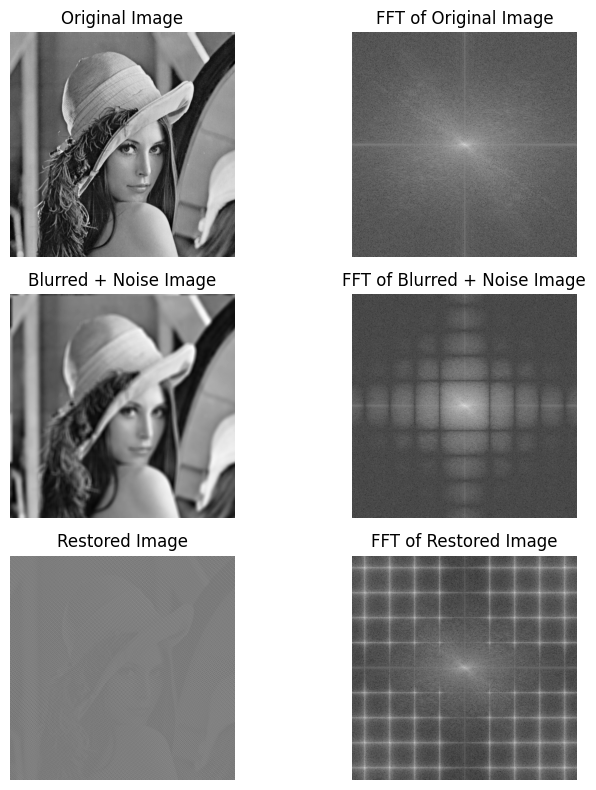

In [9]:
fig, axs = plt.subplots(3, 2, figsize=(8, 8))

# original
axs[0, 0].imshow(image, cmap='gray')
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

image_fft = np.fft.fft2(image)
axs[0, 1].imshow(np.log(np.abs(np.fft.fftshift(image_fft))), cmap='gray')
axs[0, 1].set_title('FFT of Original Image')
axs[0, 1].axis('off')


# blurred + Noise
axs[1, 0].imshow(noisy_blurred_image1b, cmap='gray')
axs[1, 0].set_title('Blurred + Noise Image')
axs[1, 0].axis('off')

noisy_blurred_image_fft = np.fft.fft2(noisy_blurred_image1b)
axs[1, 1].imshow(np.log(np.abs(np.fft.fftshift(noisy_blurred_image_fft))), cmap='gray')
axs[1, 1].set_title('FFT of Blurred + Noise Image')
axs[1, 1].axis('off')


# restored
axs[2, 0].imshow(restored_image1b, cmap='gray')
axs[2, 0].set_title('Restored Image')
axs[2, 0].axis('off')

restored_image_fft = np.fft.fft2(restored_image1b)
axs[2, 1].imshow(np.log(np.abs(np.fft.fftshift(restored_image_fft))), cmap='gray')
axs[2, 1].set_title('FFT of Restored Image')
axs[2, 1].axis('off')

plt.tight_layout()
plt.show()

Cuando el desenfoque se combina con ruido, el filtrado inverso amplifica aún más el ruido, produciendo resultados poco útiles.

In [10]:
MSE = np.mean((image - restored_image1b)**2)
print('MSE = ' + str(MSE))

MSE = 915588.6323441027


## Prueba de Valores

In [11]:
kernel_sizes = [2, 4, 8, 12, 16]
noise_levels = [1e-4, 1e-3, 1e-2, 1e-1, 1]

mse_table = []
for kernel_size in kernel_sizes:
  row = []
  inverse_filter_fft = calculate_inverse_filter(blurred_image1, kernel_size)
  for noise_level in noise_levels:
    # Aplicar blur
    blurred_image = blur_image(image, kernel_size)

    # Filtro inverso para deblurear
    inverse_filter_fft = calculate_inverse_filter(blurred_image, kernel_size)

    # Agregar ruido
    noisy_blurred_image = add_noise(blurred_image, noise_level)

    # Aplicar filtro inverso
    restored_image = apply_inverse_filter(noisy_blurred_image, inverse_filter_fft)

    mse = np.mean((image - restored_image)**2)
    row.append(mse)
  mse_table.append(row)


print("Tabla de MSE:")
print("-" * 105)
print("|  Kernel Size \ Noise \t|", end="")
for noise_level in noise_levels:
  print(f"    {noise_level:.4f}\t|", end="")
print()
print("-" * 105)

for i, row in enumerate(mse_table):
  print(f"|\t    {kernel_sizes[i]}\t\t|", end="")
  for mse in row:
    print(f"   {mse:.3e} \t|", end="")
  print()
print("-" * 105)


Tabla de MSE:
---------------------------------------------------------------------------------------------------------
|  Kernel Size \ Noise 	|    0.0001	|    0.0010	|    0.0100	|    0.1000	|    1.0000	|
---------------------------------------------------------------------------------------------------------
|	    2		|   4.540e-01 	|   4.016e+01 	|   3.925e+03 	|   3.704e+05 	|   3.999e+07 	|
|	    4		|   1.685e+00 	|   1.171e+02 	|   1.190e+04 	|   1.180e+06 	|   1.185e+08 	|
|	    8		|   5.573e+00 	|   2.815e+02 	|   2.668e+04 	|   2.702e+06 	|   2.667e+08 	|
|	    12		|   1.818e+00 	|   1.347e+02 	|   1.449e+04 	|   1.526e+06 	|   1.617e+08 	|
|	    16		|   1.877e+01 	|   6.022e+02 	|   5.748e+04 	|   5.718e+06 	|   5.769e+08 	|
---------------------------------------------------------------------------------------------------------


Se observa cómo, a mayor ruido, el MSE obtenido se incrementa considerablemente, lo cual también se ve aumentando con un efecto más intenso de blur que distorsiona más todavía el ruido aplicado al aplicar el filtrado inverso.

# 2 - Wiener Blur + Noise

El filtro Wiener es una mejora del filtrado inverso que considera la presencia de ruido en la imagen degradada. En lugar de una simple división, combina la DTF con la relación señal-ruido para obtener una estimación más precisa de la imagen original. El filtro Wiener tiende a tener un mejor desempeño que el filtrado inverso en escenarios con ruido.

Una aproximación usada frecuentemente para la estimación por Wiener es la siguiente

$$\hat{F}(u,v) = \left[ \frac{1}{H(u,v)} \frac{|H(u,v)|^2}{|H(u,v)|^2 + K} \right] G(u,v)$$ donde la constante $K$ se ajusta para mejorar el resultado visual.

*Referencias: Gonzalez&Woods, 5 Image Restoration and Reconstruction*

In [12]:
def create_wiener_filter(noisy_blurred_image, kernel_size, noise_variance):
  """Crea el filtro de Wiener.

  Args:
    noisy_blurred_image: La imagen desenfocada con ruido.
    kernel_size: El tamaño del kernel de desenfoque.
    noise_variance: La varianza del ruido.

  Returns:
    El filtro de Wiener en el dominio de la frecuencia.
  """
  threshold = 1e-5

  kernel = np.ones((kernel_size, kernel_size)) / (kernel_size * kernel_size)
  kernel_fft = np.fft.fft2(kernel, s=noisy_blurred_image.shape)

  wiener_filter_fft = np.conj(kernel_fft) / (np.abs(kernel_fft)**2 + noise_variance)

  return wiener_filter_fft

def apply_wiener_filter(noisy_blurred_image, wiener_filter_fft):
  """Aplica el filtro de Wiener a la imagen.

  Args:
    noisy_blurred_image: La imagen desenfocada con ruido.
    wiener_filter_fft: El filtro de Wiener en el dominio de la frecuencia.

  Returns:
    La imagen restaurada.
  """
  noisy_blurred_image_fft = np.fft.fft2(noisy_blurred_image)
  restored_image_fft = noisy_blurred_image_fft * wiener_filter_fft
  restored_image = np.fft.ifft2(restored_image_fft).real

  return restored_image

In [13]:
kernel_size = 9

noise_variance = 0.1
noisy_blurred_image2 = add_noise(blurred_image1, noise_variance)

K = 1e-3 # ajustado a mano

wiener_filter_fft2 = create_wiener_filter(noisy_blurred_image2, kernel_size, K)
restored_image2 = apply_wiener_filter(noisy_blurred_image2, wiener_filter_fft2)

restored_image2_inverse = apply_inverse_filter(noisy_blurred_image2, inverse_filter_fft1)

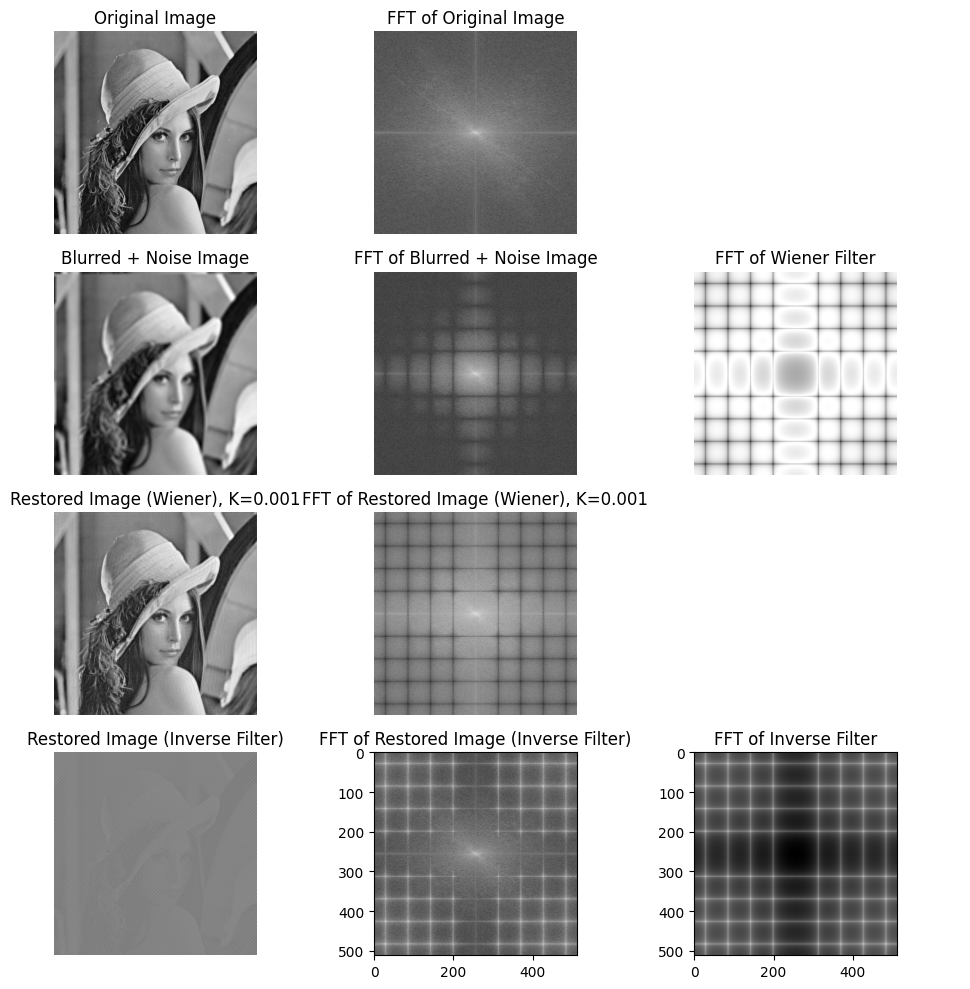

In [14]:
fig, axs = plt.subplots(4, 3, figsize=(10, 10))

# original
axs[0, 0].imshow(image, cmap='gray')
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

# FFT of original
image_fft = np.fft.fft2(image)
axs[0, 1].imshow(np.log(np.abs(np.fft.fftshift(image_fft))), cmap='gray')
axs[0, 1].set_title('FFT of Original Image')
axs[0, 1].axis('off')


# noisy blurred
axs[1, 0].imshow(noisy_blurred_image2, cmap='gray')
axs[1, 0].set_title('Blurred + Noise Image')
axs[1, 0].axis('off')

# FFT of noisy blurred
noisy_blurred_image_fft2 = np.fft.fft2(noisy_blurred_image2)
axs[1, 1].imshow(np.log(np.abs(np.fft.fftshift(noisy_blurred_image_fft2))), cmap='gray')
axs[1, 1].set_title('FFT of Blurred + Noise Image')
axs[1, 1].axis('off')


# restored with Wiener
axs[2, 0].imshow(restored_image2, cmap='gray')
axs[2, 0].set_title(f'Restored Image (Wiener), K={K}')
axs[2, 0].axis('off')

# FFT of restored with Wiener
restored_image_fft = np.fft.fft2(restored_image2)
axs[2, 1].imshow(np.log(np.abs(np.fft.fftshift(restored_image_fft))), cmap='gray')
axs[2, 1].set_title(f'FFT of Restored Image (Wiener), K={K}')
axs[2, 1].axis('off')

# Wiener filter in frequency domain
axs[1, 2].imshow(np.log(np.abs(np.fft.fftshift(wiener_filter_fft2))), cmap='gray')
axs[1, 2].set_title('FFT of Wiener Filter')
axs[1, 2].axis('off')


# restored with inverse
axs[3, 0].imshow(restored_image2_inverse, cmap='gray')
axs[3, 0].set_title('Restored Image (Inverse Filter)')
axs[3, 0].axis('off')

# FFT of restored with inverse
restored_image_fft2_inverse = np.fft.fft2(restored_image2_inverse)
axs[3, 1].imshow(np.log(np.abs(np.fft.fftshift(restored_image_fft2_inverse))), cmap='gray')
axs[3, 1].set_title('FFT of Restored Image (Inverse Filter)')

# FFT of inverse filter
axs[3, 2].imshow(np.log(np.abs(np.fft.fftshift(inverse_filter_fft1))), cmap='gray')
axs[3, 2].set_title('FFT of Inverse Filter')


axs[0, 2].axis('off')
axs[2, 2].axis('off')


plt.tight_layout()
plt.show()

Se observa un notable mejor desempeño de la restauración por filtro de Wierner, comparado a la restauración por inverse filtering, destacando la consideración sobre el ruido.

In [15]:
MSE_wiener = np.mean((image - restored_image2) ** 2)
MSE_inverse = np.mean((image - restored_image2_inverse) ** 2)
print('MSE (Wiener) = ' + str(MSE_wiener))
print('MSE (Inverse) = ' + str(MSE_inverse))

MSE (Wiener) = 33.515644360298325
MSE (Inverse) = 601393.0866279223


In [16]:
kernel_sizes = [2, 4, 8, 12, 16]
noise_levels = [1e-4, 1e-3, 1e-2, 1e-1, 1]

mse_table = []
for kernel_size in kernel_sizes:
  row = []
  for noise_level in noise_levels:
    # Aplicar blur
    blurred_image = blur_image(image, kernel_size)

    # Agregar ruido
    noisy_blurred_image = add_noise(blurred_image, noise_level)

    # Aplicar filtro de Wiener
    wiener_filter_fft = create_wiener_filter(noisy_blurred_image, kernel_size, noise_level)
    restored_image = apply_wiener_filter(noisy_blurred_image, wiener_filter_fft)

    mse = np.mean((image - restored_image)**2)
    row.append(mse)
  mse_table.append(row)


print("Tabla de MSE (Wiener):")
print("-" * 105)
print("|  Kernel Size \ Noise \t|", end="")
for noise_level in noise_levels:
  print(f"    {noise_level:.4f}\t|", end="")
print()
print("-" * 105)

for i, row in enumerate(mse_table):
  print(f"|\t    {kernel_sizes[i]}\t\t|", end="")
  for mse in row:
    print(f"   {mse:.3e} \t|", end="")
  print()
print("-" * 105)


Tabla de MSE (Wiener):
---------------------------------------------------------------------------------------------------------
|  Kernel Size \ Noise 	|    0.0001	|    0.0010	|    0.0100	|    0.1000	|    1.0000	|
---------------------------------------------------------------------------------------------------------
|	    2		|   1.877e-01 	|   5.429e-01 	|   3.239e+00 	|   1.515e+02 	|   4.439e+03 	|
|	    4		|   2.068e+00 	|   5.300e+00 	|   1.466e+01 	|   1.789e+02 	|   4.487e+03 	|
|	    8		|   1.142e+01 	|   2.652e+01 	|   5.585e+01 	|   2.497e+02 	|   4.577e+03 	|
|	    12		|   2.428e+01 	|   5.382e+01 	|   1.026e+02 	|   3.187e+02 	|   4.658e+03 	|
|	    16		|   4.188e+01 	|   7.960e+01 	|   1.410e+02 	|   3.795e+02 	|   4.733e+03 	|
---------------------------------------------------------------------------------------------------------


Comparando esta tabla con la obtenida para inverse filtering, se observa una menor dependencia del MSE con el kernel size (nivel de blur) para un mismo nivel de ruido; *se dispara menos a mayor blur*; además de presentar menor MSE en términos absolutos en todas las combinaciones.

# 3 - Blind Deconvolution

La deconvolución ciega es una técnica avanzada para restaurar imágenes degradadas cuando se desconoce la DTF del filtro causante del desenfoque o distorsión. A diferencia de otros métodos que requieren conocimiento previo de la DTF, la deconvolución ciega estima simultáneamente la imagen original y la DTF a partir de la imagen degradada.

El término "ciega" se refiere a la falta de conocimiento previo sobre la DTF. La mayoría de los métodos de restauración dependen de la DTF para estimar la imagen original. En ausencia de esta información, la deconvolución ciega emplea algoritmos iterativos que "aprenden" de la imagen degradada para reconstruir la imagen original y la DTF perdida.

Los algoritmos de deconvolución ciega siguen un proceso iterativo:

1. Inicialización: se comienza con una estimación inicial aleatoria de la imagen original y la DTF.
2. Estimación de la imagen: se utiliza la DTF actual para estimar la imagen original mediante técnicas de filtrado inverso en el dominio de la frecuencia.
3. Actualización de la DTF: se emplea la imagen restaurada para actualizar la estimación de la DTF. Se calcula la relación entre la imagen degradada y la imagen restaurada para obtener la nueva DTF.
4. Regularización: en cada iteración, se aplica una técnica de regularización para evitar soluciones inestables o artefactos en la imagen restaurada. La regularización puede limitar el crecimiento excesivo de valores en la DTF o incorporar restricciones basadas en el conocimiento previo de la imagen (por ejemplo, suavidad).
5. Iteración: los pasos 2 a 4 se repiten varias veces hasta que se alcanza la convergencia, es decir, cuando la estimación de la imagen y la DTF dejan de cambiar significativamente entre iteraciones.

> Sobre la regularización

La regularización funciona agregando un término de penalización a la función de costo que el modelo busca minimizar. Este término penaliza a los modelos que son demasiado complejos o que tienen coeficientes muy grandes. Al hacerlo, se fomenta la simplicidad del modelo y se reduce el riesgo de sobreajuste.

Las regularizaciones L1 (Lasso) y L2 (Ridge) son dos de las técnicas de regularización más comunes. Se diferencian en la forma en que penalizan los coeficientes del modelo.

In [17]:
def blind_deconvolution(kernel_size, blurred_image, iterations=10, reg_param=0.01, reg_type='L2'):
  """Aplica deconvolución ciega a la imagen desenfocada.

  Args:
    blurred_image: La imagen desenfocada.
    iterations: El número de iteraciones a realizar.
    reg_param: Parámetro de regularización.
    reg_type: Tipo de regularización ('L1' o 'L2').
  Returns:
    La imagen restaurada y el kernel estimado.
  """

  # kernel random para iniciar
  kernel = np.random.rand(kernel_size, kernel_size)
  kernel /= np.sum(kernel)

  for _ in range(iterations):
    kernel_fft = np.fft.fft2(kernel, s=blurred_image.shape)
    blurred_image_fft = np.fft.fft2(blurred_image)

    # filtro inverso con kernel actual
    restored_image_fft = blurred_image_fft / (kernel_fft + 1e-5)
    restored_image = np.fft.ifft2(restored_image_fft).real

    # estimación del kernel usando la imagen restaurada
    restored_image_fft = np.fft.fft2(restored_image)
    new_kernel_fft = blurred_image_fft / (restored_image_fft + 1e-5)
    new_kernel = np.fft.ifft2(new_kernel_fft).real

    # regularización
    if reg_type == 'L1':
      new_kernel -= reg_param * np.sign(new_kernel)
    elif reg_type == 'L2':
      laplacian_kernel = cv2.filter2D(new_kernel, -1, np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]]))
      new_kernel -= reg_param * laplacian_kernel

    # normalización
    new_kernel /= np.sum(new_kernel)

    # actualización
    kernel = new_kernel

  return restored_image, kernel

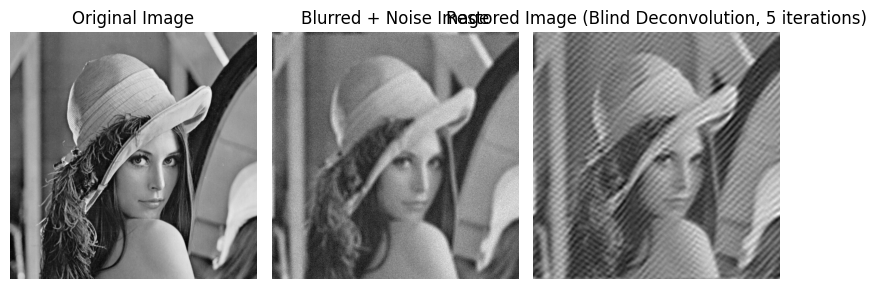

MSE for 5 iterations: 962.5559689872922


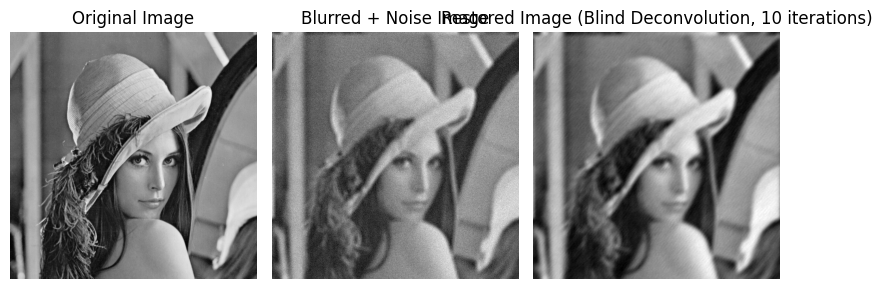

MSE for 10 iterations: 467.72889960087025


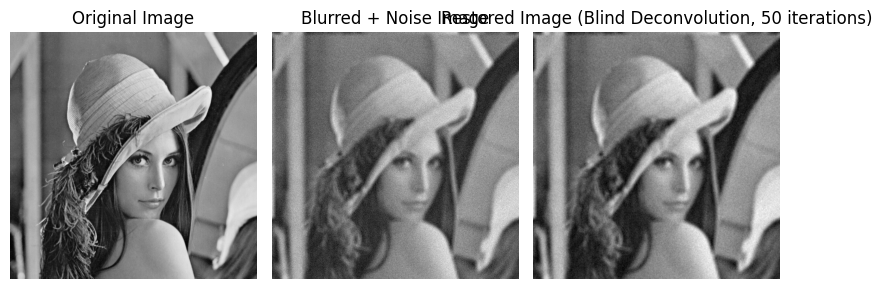

MSE for 50 iterations: 733.8808508170916


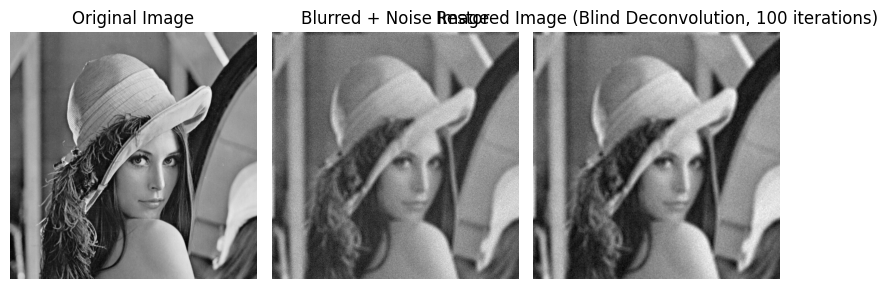

MSE for 100 iterations: 733.6521949327292


In [18]:
kernel_size = 9
blurred_image = blur_image(image, kernel_size)
noise_variance = 10
noisy_blurred_image = add_noise(blurred_image, noise_variance)

iterations_list = [5, 10, 50, 100]

for iterations in iterations_list:
  restored_image, estimated_kernel = blind_deconvolution(kernel_size, noisy_blurred_image, iterations=iterations, reg_param=5, reg_type='L2')

  fig, axs = plt.subplots(1, 3, figsize=(8, 5))

  axs[0].imshow(image, cmap='gray')
  axs[0].set_title('Original Image')
  axs[0].axis('off')

  axs[1].imshow(noisy_blurred_image, cmap='gray')
  axs[1].set_title('Blurred + Noise Image')
  axs[1].axis('off')

  axs[2].imshow(restored_image, cmap='gray')
  axs[2].set_title(f'Restored Image (Blind Deconvolution, {iterations} iterations)')
  axs[2].axis('off')

  plt.tight_layout()
  plt.show()

  mse = np.mean((image - restored_image) ** 2)
  print(f"MSE for {iterations} iterations: {mse}")

Se observa dependencia con el número de iteraciones y el parámetro de regularización (este último no mostrado en el ensayo de arriba), indicando que el algoritmo debe tunnearse adecuadamente para asegurar la convergencia.

Se destaca que el algoritmo desconoce el tipo de blur y ruido aplicado.

In [19]:
kernel_sizes = [2, 4, 8, 12, 16]
noise_levels = [1e-4, 1e-3, 1e-2, 1e-1, 1]

mse_table = []
for kernel_size in kernel_sizes:
  row = []
  for noise_level in noise_levels:
    # blur
    blurred_image = blur_image(image, kernel_size)

    # Auido
    noisy_blurred_image = add_noise(blurred_image, noise_level)

    # deconvolución ciega
    restored_image, _ = blind_deconvolution(kernel_size, noisy_blurred_image)

    mse = np.mean((image - restored_image)**2)
    row.append(mse)
  mse_table.append(row)


print("Tabla de MSE (Blind Deconvolution):")
print("-" * 105)
print("|  Kernel Size \ Noise \t|", end="")
for noise_level in noise_levels:
  print(f"    {noise_level:.4f}\t|", end="")
print()
print("-" * 105)

for i, row in enumerate(mse_table):
  print(f"|\t    {kernel_sizes[i]}\t\t|", end="")
  for mse in row:
    print(f"   {mse:.3e} \t|", end="")
  print()
print("-" * 105)


Tabla de MSE (Blind Deconvolution):
---------------------------------------------------------------------------------------------------------
|  Kernel Size \ Noise 	|    0.0001	|    0.0010	|    0.0100	|    0.1000	|    1.0000	|
---------------------------------------------------------------------------------------------------------
|	    2		|   9.061e+00 	|   1.788e+01 	|   2.762e+01 	|   2.189e+01 	|   3.133e+01 	|
|	    4		|   5.167e+01 	|   1.342e+03 	|   9.837e+01 	|   5.735e+01 	|   5.866e+02 	|
|	    8		|   1.009e+02 	|   1.846e+02 	|   1.729e+02 	|   2.663e+02 	|   2.067e+03 	|
|	    12		|   3.039e+02 	|   1.052e+03 	|   3.056e+03 	|   3.582e+02 	|   1.459e+04 	|
|	    16		|   1.000e+03 	|   2.575e+02 	|   3.371e+02 	|   5.425e+02 	|   1.906e+04 	|
---------------------------------------------------------------------------------------------------------


# 4 - Motion Blur

El motion blur ocurre cuando hay movimiento relativo entre la cámara y la escena durante la captura de una imagen, generando un efecto de barrido en la dirección del movimiento.

Referencias:
* *Gonzalez&Woods, 5 Image Restoration and Reconstruction*
* [How to apply Motion Blur to Images](https://medium.com/@itberrios6/how-to-apply-motion-blur-to-images-75b745e3ef17)

Se crea una función para crear kernels de linear motion blur, con posibilidad de elegir la intensidad (ksize) y el ángulo del blur.

In [20]:
def create_motion_blur_kernel(size, angle):
    """
    Crea un kernel de motion blur con un tamaño y ángulo específicos.

    Args:
        size: Tamaño del kernel
        angle: Ángulo del blur en grados

    Returns:
        Un kernel de motion blur.
    """
    kernel = np.zeros((size, size))
    center = size // 2
    angle_rad = np.deg2rad(angle)

    x_end = int(center + np.cos(angle_rad) * (center - 1))
    y_end = int(center + np.sin(angle_rad) * (center - 1))

    cv2.line(kernel, (center, center), (x_end, y_end), 1, thickness=1)
    return kernel / np.sum(kernel)

def apply_motion_blur(image, kernel):
    """
    Aplica un kernel de motion blur a una imagen en el dominio de la frecuencia.

    Args:
        image: Imagen en escala de grises a la que se aplicará el blur.
        kernel: Kernel de motion blur.

    Returns:
        Imagen desenfocada por motion blur.
    """
    image_fft = np.fft.fft2(image)
    kernel_fft = np.fft.fft2(kernel, s=image.shape)
    blurred_fft = image_fft * kernel_fft
    blurred_image = np.fft.ifft2(blurred_fft).real
    return np.clip(blurred_image, 0, 255)

In [21]:
image = cv2.imread('lena.png', cv2.IMREAD_GRAYSCALE)
ksize = 32
angle = 20
kernel = create_motion_blur_kernel(ksize, angle)
blurred_image = apply_motion_blur(image, kernel)

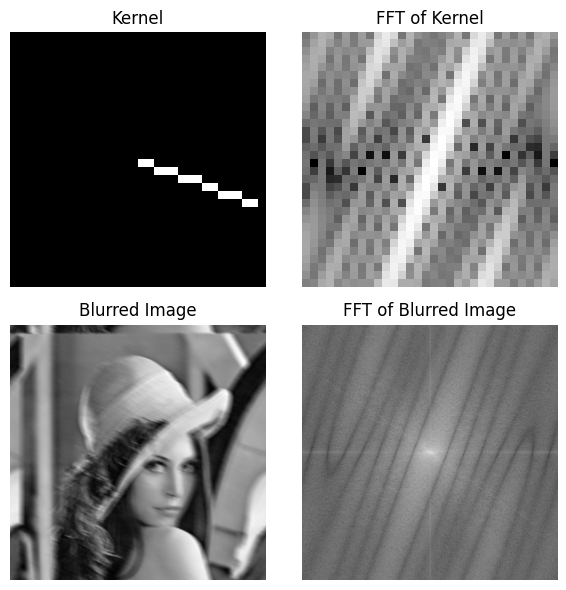

In [22]:
fig, axs = plt.subplots(2, 2, figsize=(6, 6))

# Kernel
axs[0, 0].imshow(kernel, cmap='gray')
axs[0, 0].set_title('Kernel')
axs[0, 0].axis('off')

kernel_fft = np.fft.fft2(kernel)
axs[0, 1].imshow(np.log(np.abs(np.fft.fftshift(kernel_fft))), cmap='gray')
axs[0, 1].set_title('FFT of Kernel')
axs[0, 1].axis('off')

# Blurred Image
axs[1, 0].imshow(blurred_image, cmap='gray')
axs[1, 0].set_title('Blurred Image')
axs[1, 0].axis('off')

blurred_image_fft = np.fft.fft2(blurred_image)
axs[1, 1].imshow(np.log(np.abs(np.fft.fftshift(blurred_image_fft))), cmap='gray')
axs[1, 1].set_title('FFT of Blurred Image')
axs[1, 1].axis('off')


plt.tight_layout()
plt.show()

Teniendo conocimiento del blur aplicado, es posible restaurarla a través de inverse filtering.

In [23]:
def inverse_filter(blurred_image, kernel):
    kernel_fft = np.fft.fft2(kernel, s=blurred_image.shape)
    blurred_fft = np.fft.fft2(blurred_image)
    inverse_kernel_fft = 1 / (kernel_fft + 1e-5)  # threshold
    restored_fft = blurred_fft * inverse_kernel_fft
    restored_image = np.fft.ifft2(restored_fft).real
    return np.clip(restored_image, 0, 255)

In [24]:
restored_inverse = inverse_filter(blurred_image, kernel)

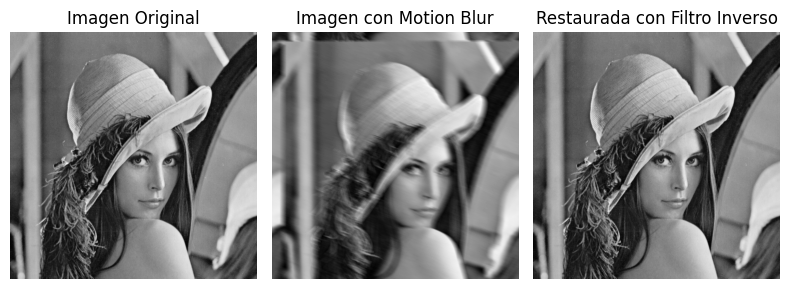

In [25]:
fig, axs = plt.subplots(1, 3, figsize=(8, 5))

axs[0].imshow(image, cmap='gray')
axs[0].set_title('Imagen Original')
axs[0].axis('off')

axs[1].imshow(blurred_image, cmap='gray')
axs[1].set_title('Imagen con Motion Blur')
axs[1].axis('off')

axs[2].imshow(restored_inverse, cmap='gray')
axs[2].set_title('Restaurada con Filtro Inverso')
axs[2].axis('off')

plt.tight_layout()
plt.show()

In [26]:
MSE_inverse = np.mean((image - restored_inverse) ** 2)
print('MSE (Inverse) = ' + str(MSE_inverse))

MSE (Inverse) = 3.586858148365979e-05


Sin la aplicación de ruido, la resteauración tiene buena calidad, viéndose en el MSE obtenido.

## Con ruido

In [27]:
def wiener_filter(blurred_image, kernel, K):
    kernel_fft = np.fft.fft2(kernel, s=blurred_image.shape)
    blurred_fft = np.fft.fft2(blurred_image)
    kernel_power = np.abs(kernel_fft) ** 2
    wiener_filter_fft = np.conj(kernel_fft) / (kernel_power + K)
    restored_fft = blurred_fft * wiener_filter_fft
    restored_image = np.fft.ifft2(restored_fft).real
    return np.clip(restored_image, 0, 255)

In [28]:
noise_std = 10
noisy_blurred_image = blurred_image + np.random.normal(0, noise_std, image.shape)

In [29]:
restored_inverse = inverse_filter(noisy_blurred_image, kernel)
restored_wiener = wiener_filter(noisy_blurred_image, kernel, K=5e-2) # K empírico

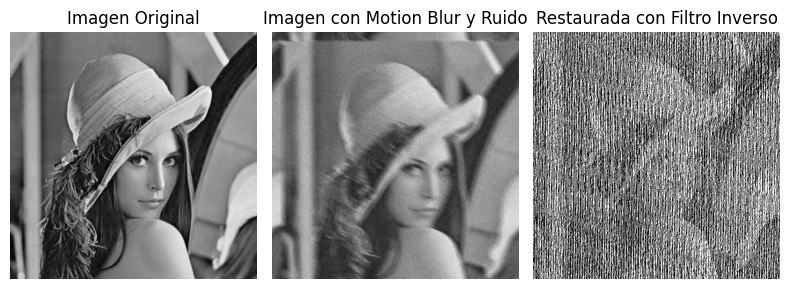

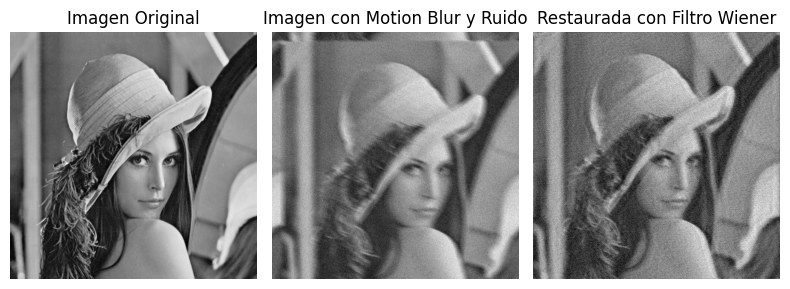

In [30]:
fig, axs = plt.subplots(1, 3, figsize=(8, 5))

axs[0].imshow(image, cmap='gray')
axs[0].set_title('Imagen Original')
axs[0].axis('off')

axs[1].imshow(noisy_blurred_image, cmap='gray')
axs[1].set_title('Imagen con Motion Blur y Ruido')
axs[1].axis('off')

axs[2].imshow(restored_inverse, cmap='gray')
axs[2].set_title('Restaurada con Filtro Inverso')
axs[2].axis('off')

plt.tight_layout()
plt.show()

fig, axs = plt.subplots(1, 3, figsize=(8, 5))

axs[0].imshow(image, cmap='gray')
axs[0].set_title('Imagen Original')
axs[0].axis('off')

axs[1].imshow(noisy_blurred_image, cmap='gray')
axs[1].set_title('Imagen con Motion Blur y Ruido')
axs[1].axis('off')

axs[2].imshow(restored_wiener, cmap='gray')
axs[2].set_title('Restaurada con Filtro Wiener')
axs[2].axis('off')

plt.tight_layout()
plt.show()

Como se vio anteriormente, con el agregado de ruido, el filtrado inverso empeora significativamente, mientras que el filtrado Wiener introduce una mejora significatva con una correcta selección del coeficiente $K$.

In [31]:
MSE_inverse = np.mean((image - restored_inverse) ** 2)
MSE_wiener = np.mean((image - restored_wiener) ** 2)
print('MSE (Inverse) = ' + str(MSE_inverse))
print('MSE (Wiener) = ' + str(MSE_wiener))

MSE (Inverse) = 12933.98483183082
MSE (Wiener) = 433.73342281611446


# 5 - Regularizacion y metodos iterativos

En el procesamiento de imágenes, las técnicas de restauración buscan revertir las degradaciones que una imagen puede sufrir debido a factores como desenfoque, ruido, o distorsiones en el sistema de adquisición. Estas degradaciones suelen modelarse con ecuaciones que representan el proceso que afecta la imagen original. Sin embargo, muchos de estos problemas son mal condicionados, es decir, pequeñas perturbaciones (como el ruido) **pueden amplificarse enormemente**, dificultando la restauración precisa.

La **teoría de regularización** surge como una solución para abordar estos problemas mal condicionados. El objetivo principal de la regularización es transformar el problema en uno bien condicionado, en el cual las soluciones sean estables y menos sensibles al ruido. La regularización introduce restricciones o información adicional (a priori) sobre la imagen original o sobre la naturaleza de la degradación, permitiendo encontrar una **solución que equilibre la calidad de la restauración y la amplificación del ruido**.

In [32]:
def add_noise(image, noise_std):
    noise = np.random.normal(0, noise_std, image.shape)
    noisy_image = image + noise
    return noisy_image

def blur_image(image, kernel_size):
    kernel = np.ones((kernel_size, kernel_size)) / (kernel_size * kernel_size)
    return convolve2d(image, kernel, mode='same', boundary='wrap')

def calculate_mse(image1, image2):
    return np.mean((image1 - image2) ** 2)

def display_images(original, degraded, restored, titles):
    fig, axs = plt.subplots(1, 3, figsize=(10, 4))
    axs[0].imshow(original, cmap='gray')
    axs[0].set_title(titles[0])
    axs[0].axis('off')

    axs[1].imshow(degraded, cmap='gray')
    axs[1].set_title(titles[1])
    axs[1].axis('off')

    axs[2].imshow(restored, cmap='gray')
    axs[2].set_title(titles[2])
    axs[2].axis('off')

    plt.show()

## Regularización directa

Estos métodos aplican directamente la ecuación del modelo de degradación para restaurar la imagen, utilizando información a priori. Un ejemplo típico es el **filtro inverso regularizado**, que **evita la amplificación extrema del ruido** controlando los valores de las altas frecuencias.

In [33]:
def inverse_filter_regularized(blurred_image, kernel, alpha=0.01):
    kernel_fft = np.fft.fft2(kernel, s=blurred_image.shape)
    blurred_fft = np.fft.fft2(blurred_image)
    inverse_filter_fft = np.conj(kernel_fft) / (np.abs(kernel_fft) ** 2 + alpha)
    restored_fft = blurred_fft * inverse_filter_fft
    restored_image = np.fft.ifft2(restored_fft).real
    return restored_image

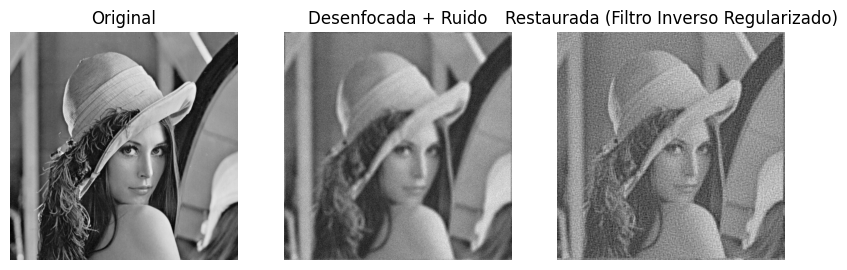

In [34]:
image = cv2.imread('lena.png', cv2.IMREAD_GRAYSCALE)
ksize = 9
blurred_image = blur_image(image, kernel_size=ksize)
noise_std = 10
noisy_blurred_image = add_noise(blurred_image, noise_std)

kernel = np.ones((ksize, ksize)) / (ksize**2)
restored_image = inverse_filter_regularized(noisy_blurred_image, kernel)

display_images(image, noisy_blurred_image, restored_image, ['Original', 'Desenfocada + Ruido', 'Restaurada (Filtro Inverso Regularizado)'])

In [35]:
MSE_inverse = calculate_mse(image, restored_image)
print('MSE (Inverse) = ' + str(MSE_inverse))

MSE (Inverse) = 1394.1267024613735


Alpha: 0.0001, MSE: 114798.799653657
Alpha: 0.001, MSE: 10377.151093913792
Alpha: 0.01, MSE: 1394.1267024613735
Alpha: 0.1, MSE: 823.1543914782256
Alpha: 1, MSE: 4812.932455160732


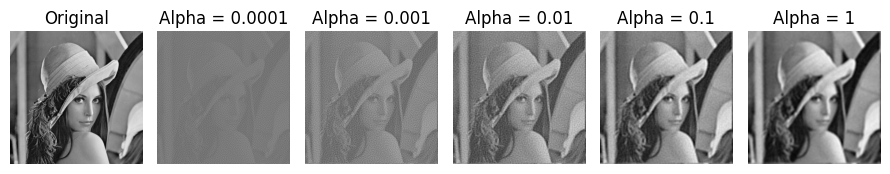

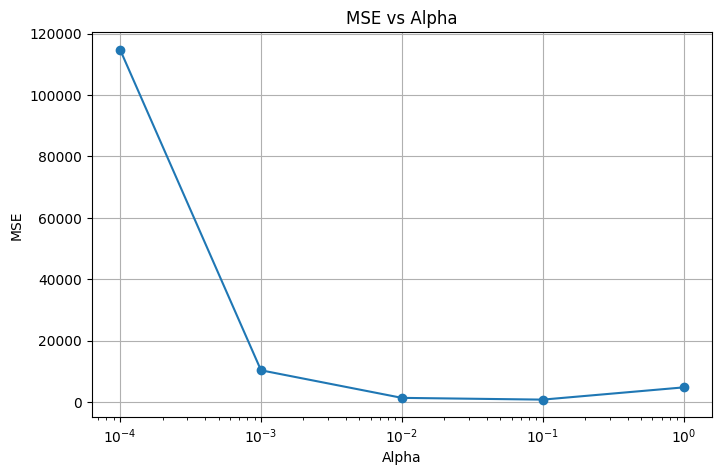

In [36]:
alpha_values = [1e-4, 1e-3, 0.01, 0.1, 1]

restored_images = []
mse_values = []

for alpha in alpha_values:
  restored_image = inverse_filter_regularized(noisy_blurred_image, kernel, alpha)
  restored_images.append(restored_image)
  mse = calculate_mse(image, restored_image)
  mse_values.append(mse)
  print(f'Alpha: {alpha}, MSE: {mse}')


fig, axs = plt.subplots(1, len(alpha_values) + 1, figsize=(9, 5))
axs[0].imshow(image, cmap='gray')
axs[0].set_title('Original')
axs[0].axis('off')

for i, restored_image in enumerate(restored_images):
  axs[i + 1].imshow(restored_image, cmap='gray')
  axs[i + 1].set_title(f'Alpha = {alpha_values[i]}')
  axs[i + 1].axis('off')

plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(alpha_values, mse_values, marker='o')
plt.xlabel('Alpha')
plt.xscale('log')
plt.ylabel('MSE')
plt.title('MSE vs Alpha')
plt.grid(True)
plt.show()

## Regularización estocástica, Wiener

Este enfoque modela tanto la imagen original como el ruido como procesos aleatorios, utilizando sus **espectros de potencia** para construir un **filtro óptimo**, como el filtro de Wiener. Este filtro considera la **SNR** para obtener una estimación más precisa de la imagen.



In [37]:
def wiener_filter(noisy_blurred_image, kernel, K):
    kernel_fft = np.fft.fft2(kernel, s=noisy_blurred_image.shape)
    noisy_blurred_fft = np.fft.fft2(noisy_blurred_image)
    kernel_power = np.abs(kernel_fft) ** 2
    wiener_filter_fft = np.conj(kernel_fft) / (kernel_power + K)
    restored_fft = noisy_blurred_fft * wiener_filter_fft
    restored_image = np.fft.ifft2(restored_fft).real
    return restored_image

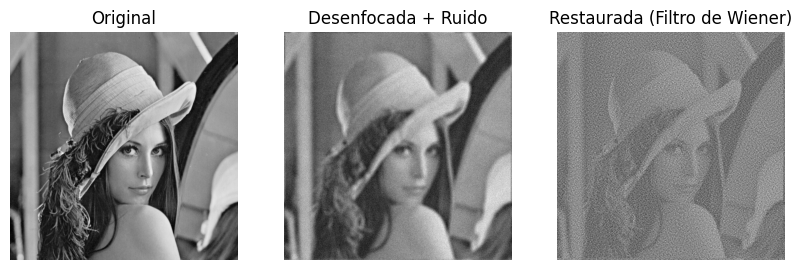

In [38]:
restored_image_wiener = wiener_filter(noisy_blurred_image, kernel, 1e-3)
display_images(image, noisy_blurred_image, restored_image_wiener, ['Original', 'Desenfocada + Ruido', 'Restaurada (Filtro de Wiener)'])

In [39]:
MSE_wiener = calculate_mse(image, restored_image_wiener)
print('MSE (Wiener) = ' + str(MSE_wiener))

MSE (Wiener) = 10377.151093913792


K = 0.0001, MSE = 114798.799653657
K = 0.001, MSE = 10377.151093913792
K = 0.01, MSE = 1394.1267024613735
K = 0.1, MSE = 823.1543914782256
K = 1, MSE = 4812.932455160732


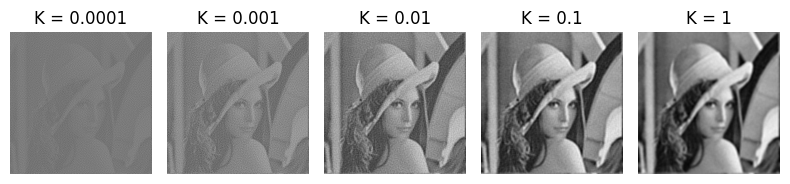

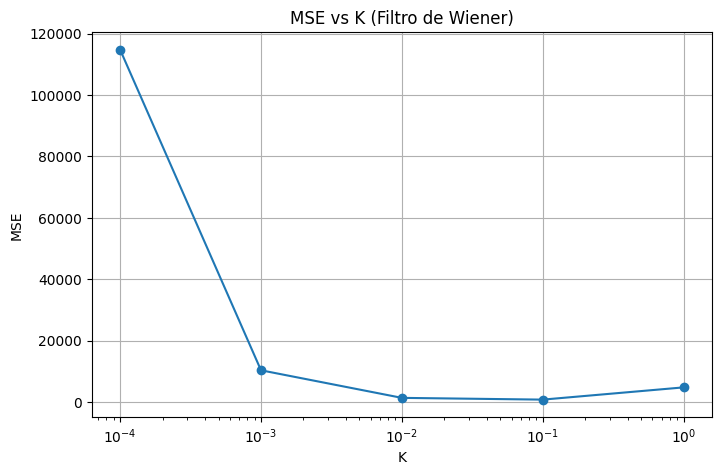

In [40]:
K_values = [1e-4, 1e-3, 0.01, 0.1, 1]
mse_values = []

plt.figure(figsize=(8, 5))

for i, K in enumerate(K_values):
    restored_image_wiener = wiener_filter(noisy_blurred_image, kernel, K=K)
    mse = calculate_mse(image, restored_image_wiener)
    mse_values.append(mse)
    print(f"K = {K}, MSE = {mse}")

    plt.subplot(1, len(K_values), i + 1)
    plt.imshow(restored_image_wiener, cmap='gray')
    plt.title(f"K = {K}")
    plt.axis('off')

plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(K_values, mse_values, marker='o')
plt.xlabel('K')
plt.xscale('log')
plt.ylabel('MSE')
plt.title('MSE vs K (Filtro de Wiener)')
plt.grid(True)
plt.show()

## Regularización determinística, Tikhonov-MIller

En este método, se emplean restricciones **deterministas** basadas en operadores matemáticos, como el **operador Laplaciano**, para minimizar la amplificación del ruido en frecuencias altas. Este tipo de regularización es útil para controlar la suavidad y las características estructurales de la imagen restaurada.

In [41]:
def tikhonov_regularization(blurred_image, kernel, alpha):
    laplacian = np.array([[0, -0.25, 0], [-0.25, 1, -0.25], [0, -0.25, 0]])
    kernel_fft = np.fft.fft2(kernel, s=blurred_image.shape)
    laplacian_fft = np.fft.fft2(laplacian, s=blurred_image.shape)
    blurred_fft = np.fft.fft2(blurred_image)

    regularized_filter = np.conj(kernel_fft) / (np.abs(kernel_fft) ** 2 + alpha * np.abs(laplacian_fft) ** 2)
    restored_fft = blurred_fft * regularized_filter
    restored_image = np.fft.ifft2(restored_fft).real
    return restored_image

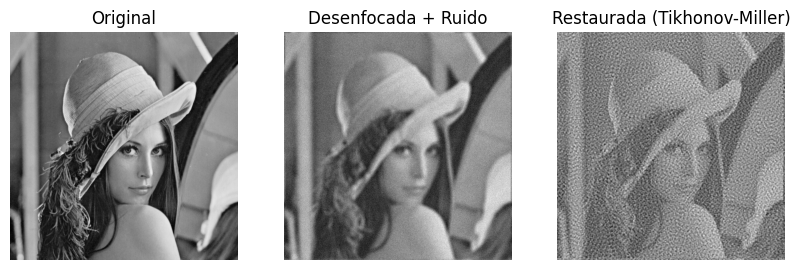

In [42]:
restored_image_tikhonov = tikhonov_regularization(noisy_blurred_image, kernel, alpha=0.01)
display_images(image, noisy_blurred_image, restored_image_tikhonov, ['Original', 'Desenfocada + Ruido', 'Restaurada (Tikhonov-Miller)'])

MSE para alpha = 0.001: 20845.099721527222
MSE para alpha = 0.01: 3805.2087616370713
MSE para alpha = 0.1: 1279.0289468666274
MSE para alpha = 1: 859.6487975381951
MSE para alpha = 10: 741.9308804605187
MSE para alpha = 100: 651.4534682558431


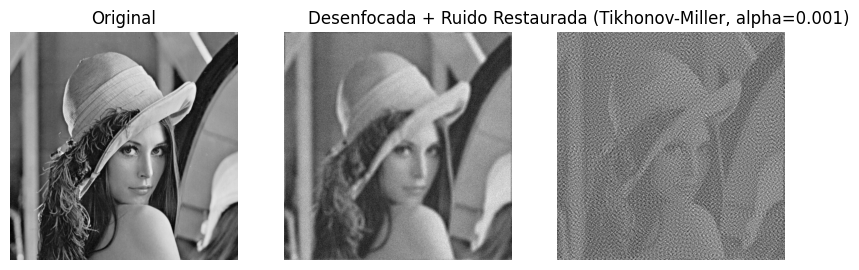

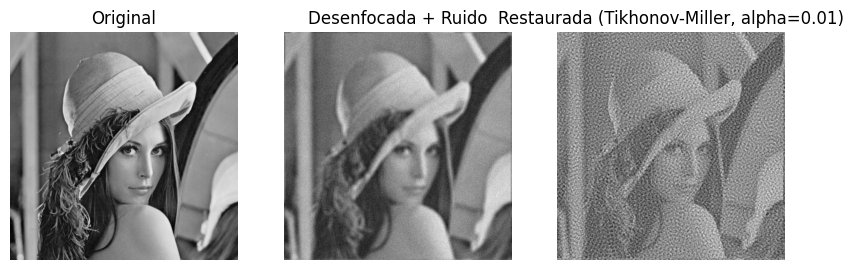

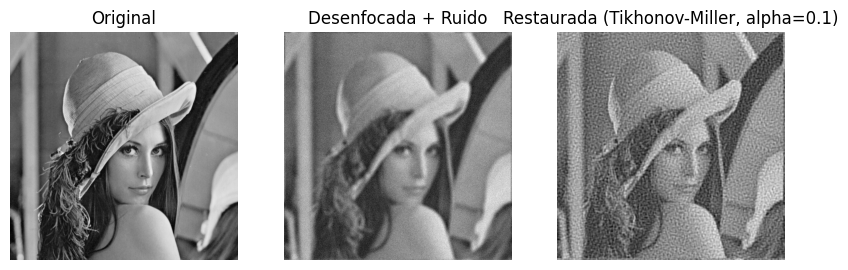

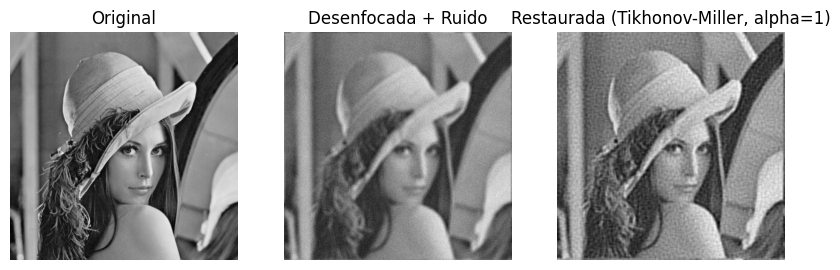

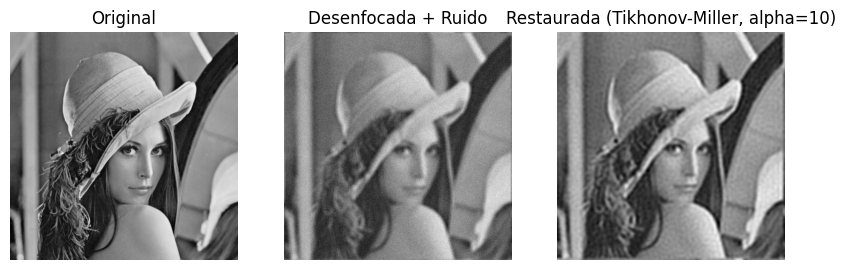

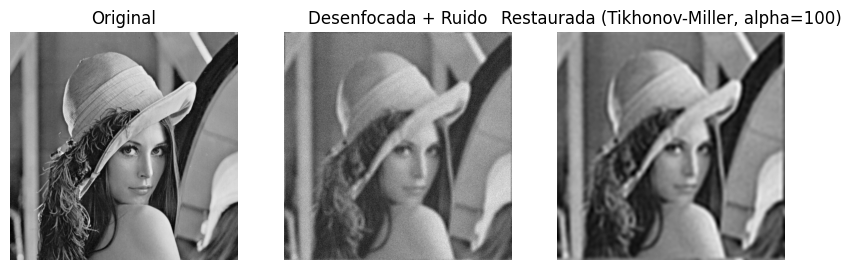

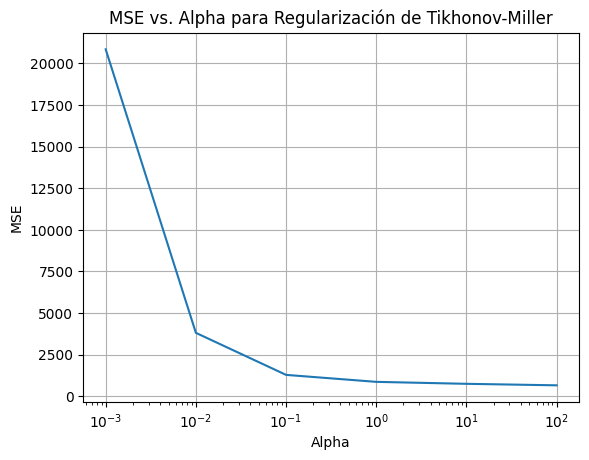

In [43]:
alpha_values = [1e-3, 0.01, 0.1, 1, 10, 100]
mse_values = []
restored_images = []

for alpha in alpha_values:
  restored_image = tikhonov_regularization(noisy_blurred_image, kernel, alpha)
  mse = calculate_mse(image, restored_image)
  mse_values.append(mse)
  restored_images.append(restored_image)
  print(f"MSE para alpha = {alpha}: {mse}")

for i, restored_image in enumerate(restored_images):
  display_images(image, noisy_blurred_image, restored_image, ['Original', 'Desenfocada + Ruido', f'Restaurada (Tikhonov-Miller, alpha={alpha_values[i]})'])


plt.plot(alpha_values, mse_values)
plt.xlabel("Alpha")
plt.xscale('log')
plt.ylabel("MSE")
plt.title("MSE vs. Alpha para Regularización de Tikhonov-Miller")
plt.grid(True)
plt.show()


## Métodos iterativos, CLS

Estos métodos no dependen de la inversión de operadores, lo que los hace más robustos frente a variaciones en los parámetros del modelo. Un ejemplo es el método de **mínimos cuadrados con restricciones (CLS)**, que optimiza la restauración en varias iteraciones. La ventaja de estos enfoques es que permiten monitorear el progreso y ajustar parámetros durante el proceso de restauración.

El algoritmo debajo, `cls_restoration`, busca restaurar una imagen degradada aplicando un proceso iterativo que minimiza el error entre la imagen degradada y la restaurada, a la vez que aplica regularización para evitar la amplificación de ruido.

Modelo de Degradación:
* Se asume que la imagen ha sido degradada por un proceso de convolución con un **kernel conocido** y, posiblemente, contaminada por ruido.

Regularización con Laplaciano:
* Permite penalizar las altas frecuencias y suavizar la imagen restaurada. El operador actúa como un highpass y al aplicarlo en el proceso iterativo, controla la amplificación de ruido en las regiones de alta frecuencia.
* El parámetro `alpha` determina cuánto peso se le da a esta **regularización**. Un valor alto de alpha aplicará una regularización más fuerte, lo que puede suavizar la imagen pero a la vez evitar la amplificación de ruido.

Iteración para minimizar el error:
* Se inicia con una estimación inicial de la imagen restaurada, que puede ser la imagen degradada misma.
* En cada iteración, el algoritmo actualiza la estimación de la imagen usando la diferencia entre la imagen observada y la reconstrucción generada por la estimación actual, ajustada por `beta`, el **paso**.
* `beta` es el **tamaño del paso**, que controla cuánta corrección se aplica en cada iteración. Un valor adecuado asegura que el algoritmo converja de manera estable.

Dominio espectral:
* La restauración se lleva a cabo en el dominio de la frecuencia ya que las operaciones de convolución y la aplicación del operador Laplaciano son más eficientes en este dominio.
* El proceso iterativo continua hasta alcanzar el número de iteraciones especificado, buscando minimizar el error en cada paso.


`alpha`: controla la penalización de las altas frecuencias para reducir la amplificación del ruido (fuerza de la regularización).

`beta`: define el tamaño del paso en el proceso iterativo, ajustando la convergencia del algoritmo.

In [44]:
def cls_restoration(blurred_image, kernel, alpha, beta, iterations):
    """
    Args:
        blurred_image: La imagen desenfocada.
        kernel: El kernel usado para desenfocar la imagen.
        alpha: Parámetro de regularización para controlar la penalización en altas frecuencias.
        beta: Tamaño del paso en cada iteración para actualizar la imagen.
        iterations: Número de iteraciones del algoritmo.

    Returns:
        La imagen restaurada tras aplicar el proceso iterativo CLS.
    """

    kernel_fft = np.fft.fft2(kernel, s=blurred_image.shape)
    blurred_fft = np.fft.fft2(blurred_image)

    # operador Laplaciano (filtro pasa-altos) en 2D
    laplacian = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
    laplacian_fft = np.fft.fft2(laplacian, s=blurred_image.shape)

    # imagen restaurada f_k como la imagen desenfocada, step 0
    f_k = blurred_image.copy()

    for _ in range(iterations):

        f_k_fft = np.fft.fft2(f_k)

        # respuesta del filtro de regularización
        H_laplacian = kernel_fft * f_k_fft + alpha * laplacian_fft * f_k_fft

        # término de actualización
        numerator = blurred_fft - H_laplacian
        update_term = beta * numerator

        # actualización en la frecuencia
        f_k_fft += update_term

        f_k = np.fft.ifft2(f_k_fft).real

    return np.clip(f_k, 0, 255)

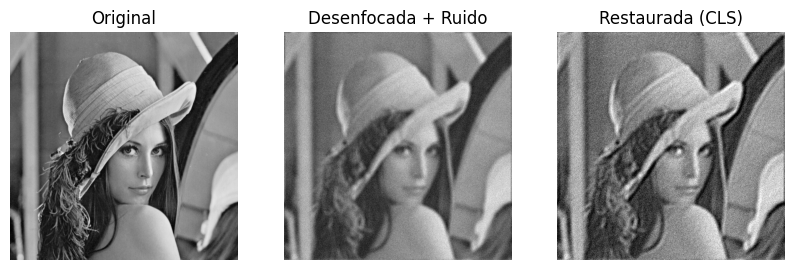

In [45]:
restored_image_cls = cls_restoration(noisy_blurred_image, kernel, alpha=0.01, beta=0.01, iterations=100)
display_images(image, noisy_blurred_image, restored_image_cls, ['Original', 'Desenfocada + Ruido', 'Restaurada (CLS)'])

In [46]:
MSE_cls = calculate_mse(image, restored_image_cls)
print('MSE (CLS) = ' + str(MSE_cls))

MSE (CLS) = 676.1269352428415


A continuación se itera para varios valores de los hiperparámetros `alpha` y `beta`, destacándose cómo la restauración se arruina completamente para valores de `beta` altos, que representan un paso iterativo muy alto, es decir, que el algoritmo **diverge**.

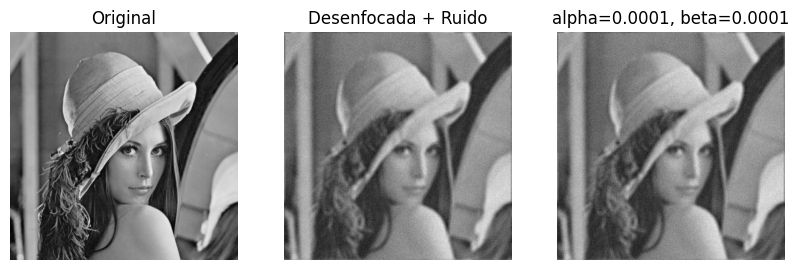

MSE para alpha = 0.0001, beta = 0.0001: 270.5019158335141


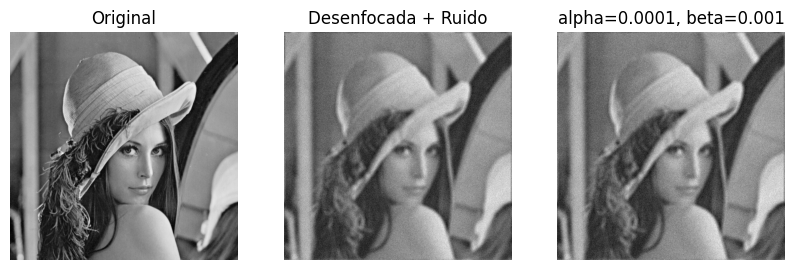

MSE para alpha = 0.0001, beta = 0.001: 283.38393964141363


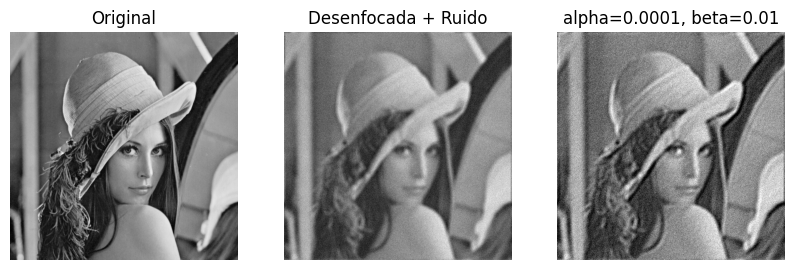

MSE para alpha = 0.0001, beta = 0.01: 675.7350769843771


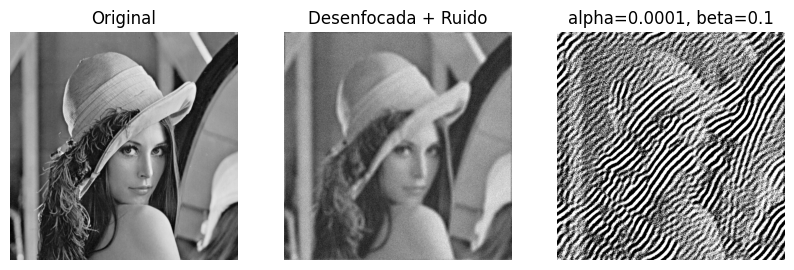

MSE para alpha = 0.0001, beta = 0.1: 12040.636068434036


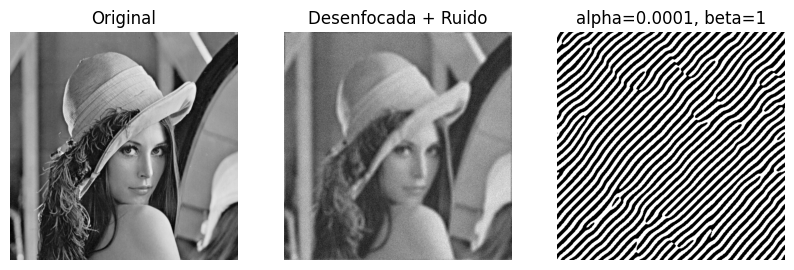

MSE para alpha = 0.0001, beta = 1: 18532.236625671387


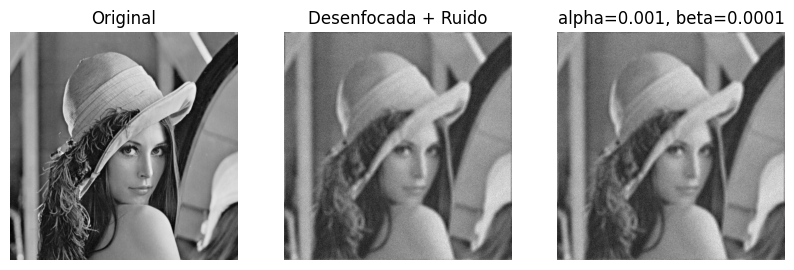

MSE para alpha = 0.001, beta = 0.0001: 270.50202147232363


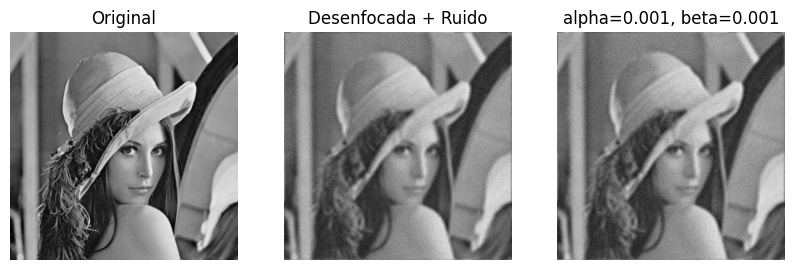

MSE para alpha = 0.001, beta = 0.001: 283.38493370808516


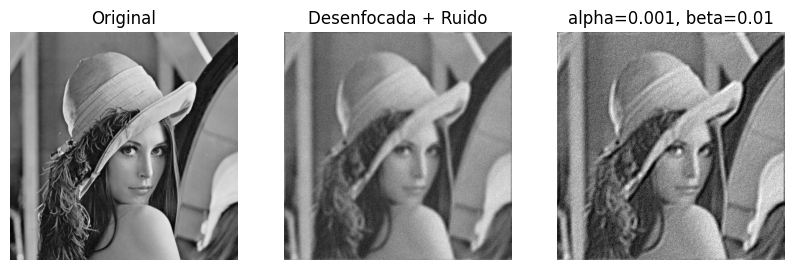

MSE para alpha = 0.001, beta = 0.01: 675.7362605186825


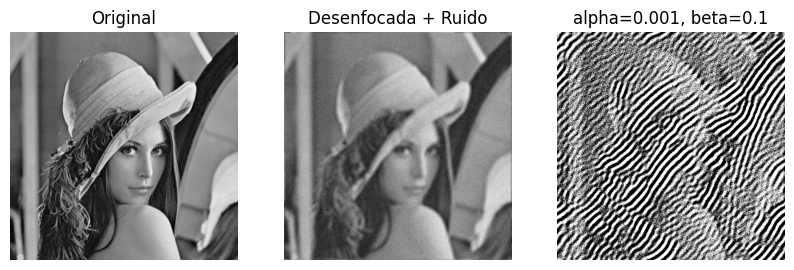

MSE para alpha = 0.001, beta = 0.1: 12038.02192583961


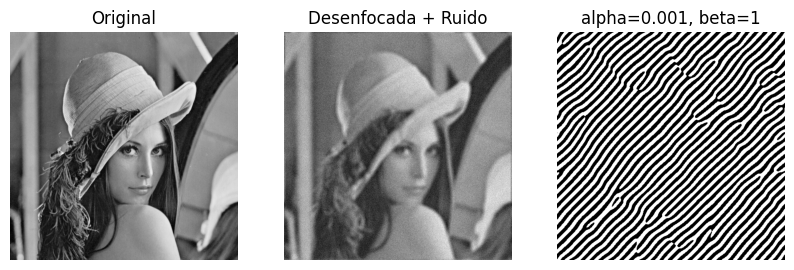

MSE para alpha = 0.001, beta = 1: 18532.164642333984


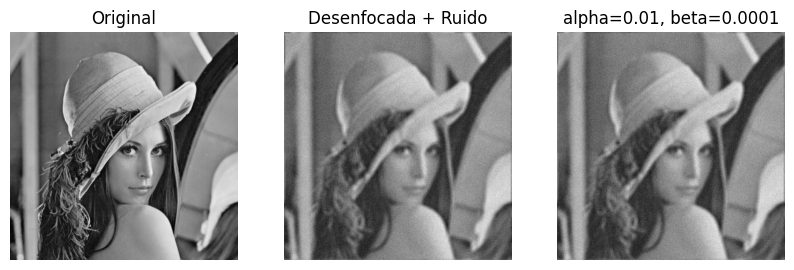

MSE para alpha = 0.01, beta = 0.0001: 270.5030957984815


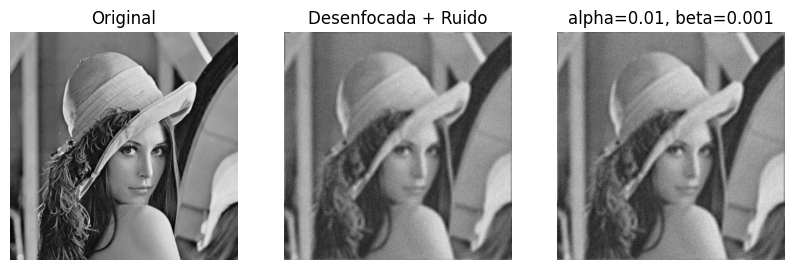

MSE para alpha = 0.01, beta = 0.001: 283.39682687284846


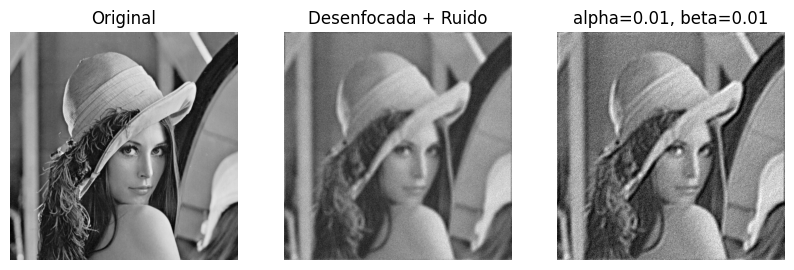

MSE para alpha = 0.01, beta = 0.01: 676.1269352428415


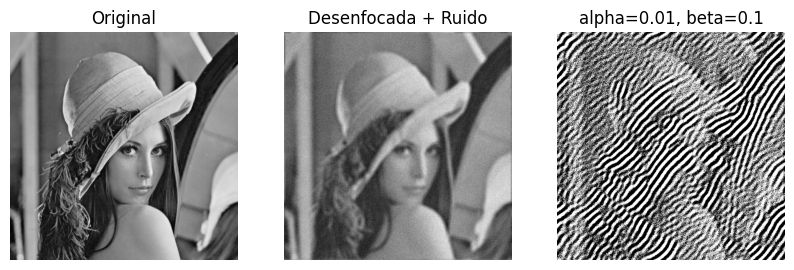

MSE para alpha = 0.01, beta = 0.1: 12062.555870215805


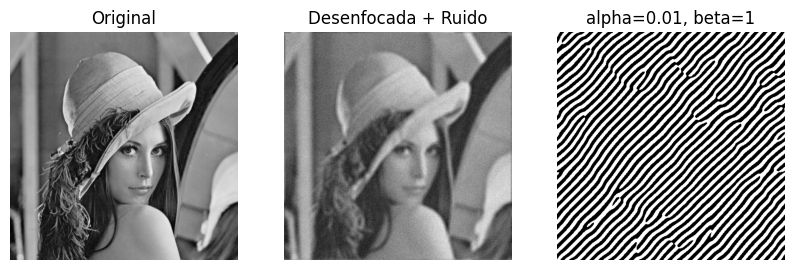

MSE para alpha = 0.01, beta = 1: 18523.46146774292


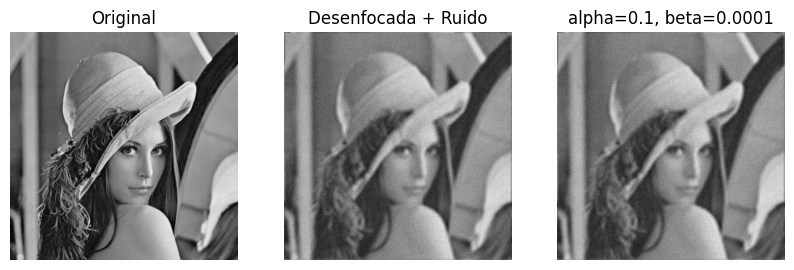

MSE para alpha = 0.1, beta = 0.0001: 270.5156307642728


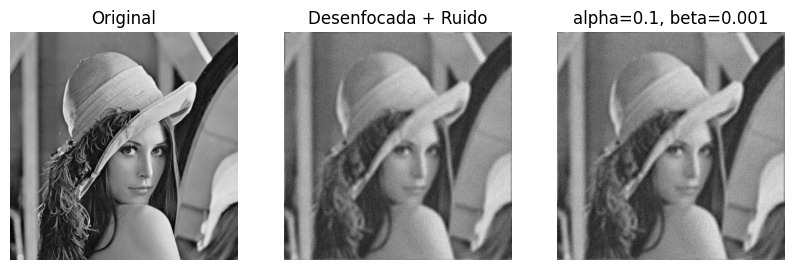

MSE para alpha = 0.1, beta = 0.001: 283.7089043016261


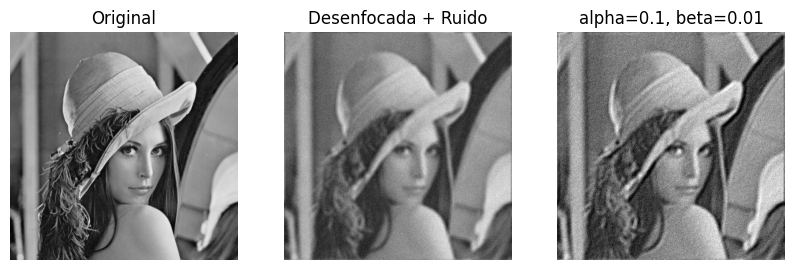

MSE para alpha = 0.1, beta = 0.01: 716.159012022057


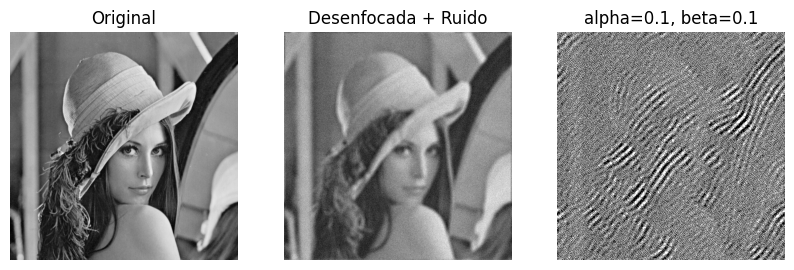

MSE para alpha = 0.1, beta = 0.1: 16686.924229187058


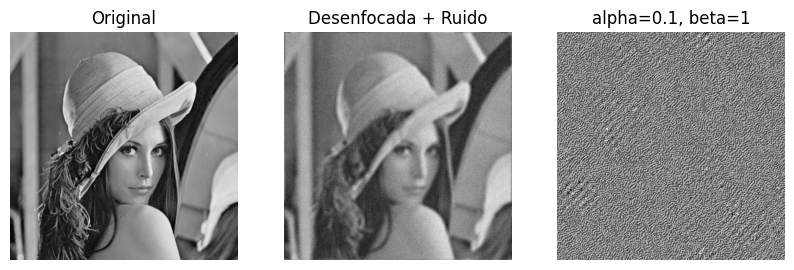

MSE para alpha = 0.1, beta = 1: 18551.4513130188


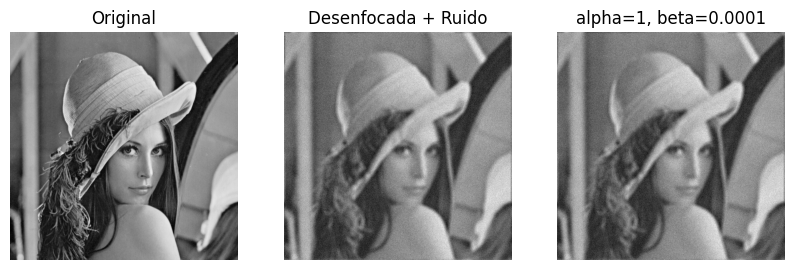

MSE para alpha = 1, beta = 0.0001: 270.81819540052174


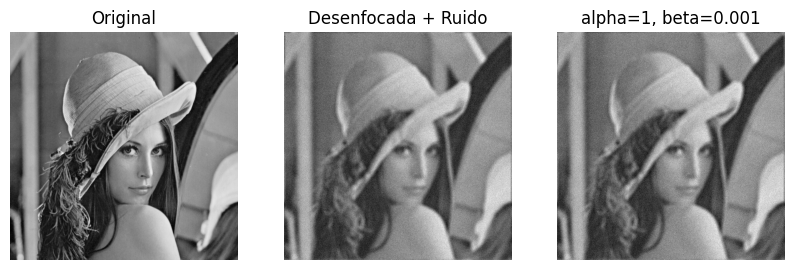

MSE para alpha = 1, beta = 0.001: 305.399170884908


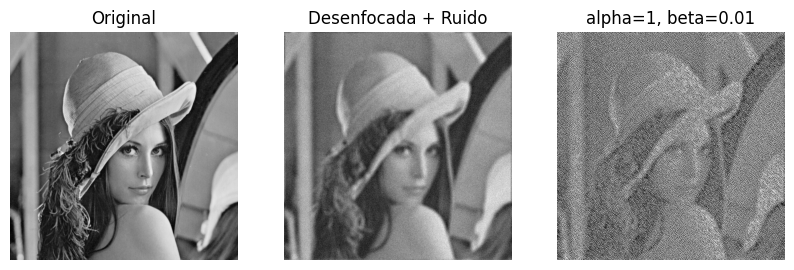

MSE para alpha = 1, beta = 0.01: 13268.400191165418


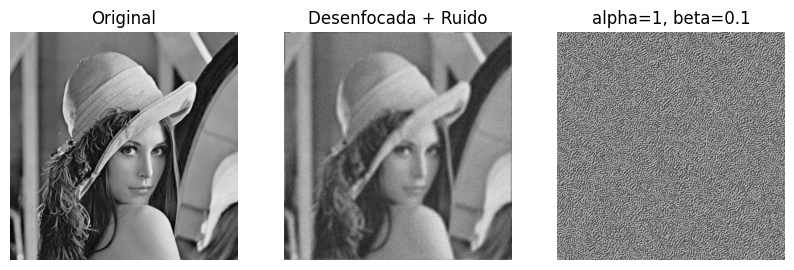

MSE para alpha = 1, beta = 0.1: 18552.311222076416


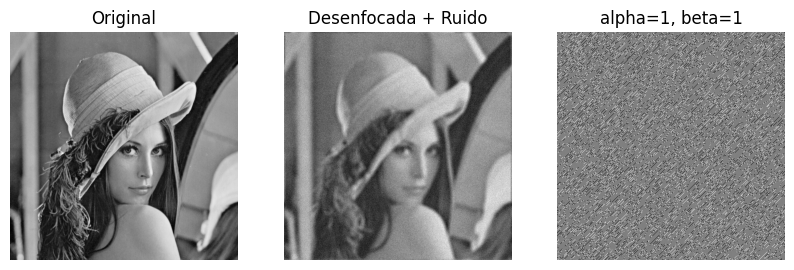

MSE para alpha = 1, beta = 1: 18549.36671447754


In [47]:
iterations = 100
alpha_values = [1e-4, 1e-3, 1e-2, 1e-1, 1]
beta_values = [1e-4, 1e-3, 1e-2, 1e-1, 1]

for alpha in alpha_values:
  for beta in beta_values:
    restored_image_cls = cls_restoration(noisy_blurred_image, kernel, alpha=alpha, beta=beta, iterations=iterations)
    display_images(image, noisy_blurred_image, restored_image_cls,
                   ['Original', 'Desenfocada + Ruido', f'alpha={alpha}, beta={beta}'])
    mse = calculate_mse(image, restored_image_cls)
    print(f"MSE para alpha = {alpha}, beta = {beta}: {mse}")

# Eliminación de interferencia

In [48]:
image = iio.imread('clown.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image_fft = np.fft.fft2(image)
image_fft_logged = np.log(np.abs(np.fft.fftshift(image_fft)))

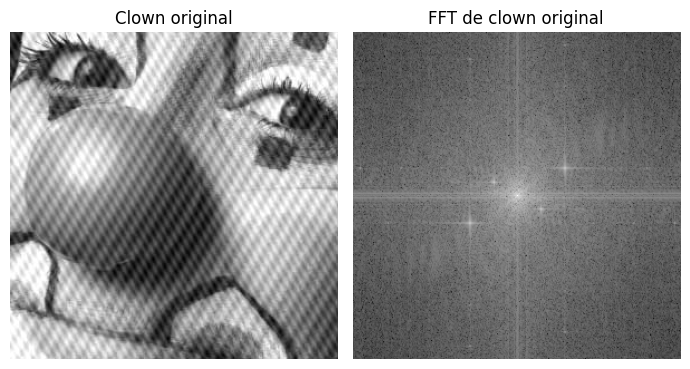

In [49]:
fig, axs = plt.subplots(1, 2, figsize=(7, 5))

axs[0].imshow(image, cmap='gray')
axs[0].set_title('Clown original')
axs[0].axis('off')

image_fft = np.fft.fft2(image)
axs[1].imshow(image_fft_logged, cmap='gray')
axs[1].set_title('FFT de clown original')
axs[1].axis('off')

plt.tight_layout()
plt.show()

Ya observando la imagen original, y más aún con su FFT, se observa una interferencia de tipo periódica contaminando el resto de la imagen, evidenciada por las idealmente deltas en el espectro, indicando un efecto tipo senoidal/periódico.

A continuación, se procede a ubicar esta interferencia en el espectro, para luego intentar mitigarla.

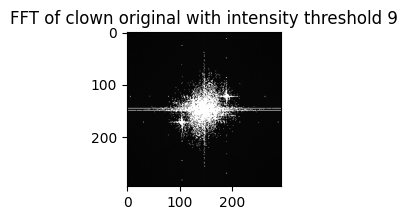

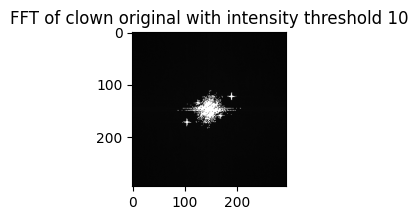

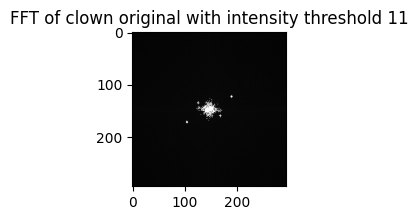

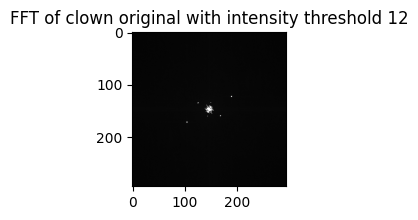

In [50]:
intensity_threshold_list = range(9, 13)

for intensity_threshold in intensity_threshold_list:
  image_fft_logged_thresholded = image_fft_logged.copy()
  image_fft_logged_thresholded[image_fft_logged_thresholded > intensity_threshold] = 255
  plt.figure(figsize=(2, 2))
  plt.imshow(image_fft_logged_thresholded, cmap='gray')
  plt.title(f'FFT of clown original with intensity threshold {intensity_threshold}')
  plt.show()

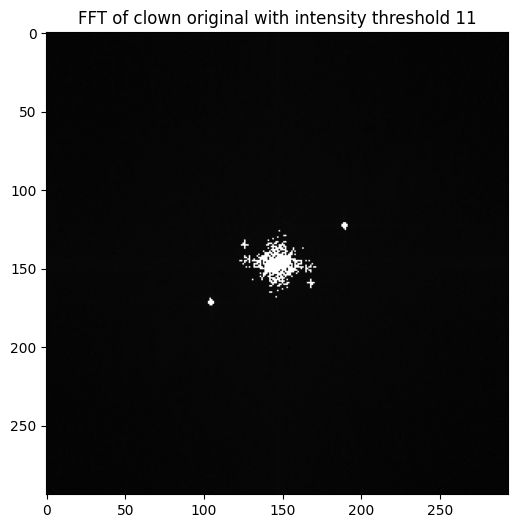

In [51]:
threshold = 11

image_fft_logged_thresholded = image_fft_logged.copy()
image_fft_logged_thresholded[image_fft_logged_thresholded > threshold] = 255
plt.figure(figsize=(6, 6))
plt.imshow(image_fft_logged_thresholded, cmap='gray')
plt.title(f'FFT of clown original with intensity threshold {threshold}')
plt.show()

In [52]:
# pixeles con valor 255
rows, cols = np.where(image_fft_logged_thresholded == 255)

for i in range(len(rows)):
  print(f"Pixel Coordinate: ({rows[i]}, {cols[i]})")

Pixel Coordinate: (121, 189)
Pixel Coordinate: (121, 190)
Pixel Coordinate: (122, 188)
Pixel Coordinate: (122, 189)
Pixel Coordinate: (122, 190)
Pixel Coordinate: (122, 191)
Pixel Coordinate: (123, 188)
Pixel Coordinate: (123, 189)
Pixel Coordinate: (123, 190)
Pixel Coordinate: (123, 191)
Pixel Coordinate: (124, 189)
Pixel Coordinate: (124, 190)
Pixel Coordinate: (125, 190)
Pixel Coordinate: (126, 148)
Pixel Coordinate: (129, 151)
Pixel Coordinate: (129, 152)
Pixel Coordinate: (130, 147)
Pixel Coordinate: (131, 144)
Pixel Coordinate: (132, 126)
Pixel Coordinate: (132, 141)
Pixel Coordinate: (133, 126)
Pixel Coordinate: (133, 146)
Pixel Coordinate: (133, 147)
Pixel Coordinate: (133, 151)
Pixel Coordinate: (133, 152)
Pixel Coordinate: (134, 125)
Pixel Coordinate: (134, 126)
Pixel Coordinate: (134, 141)
Pixel Coordinate: (134, 142)
Pixel Coordinate: (134, 143)
Pixel Coordinate: (134, 145)
Pixel Coordinate: (134, 146)
Pixel Coordinate: (134, 150)
Pixel Coordinate: (135, 124)
Pixel Coordina

Se ubican las deltas empíricamente.

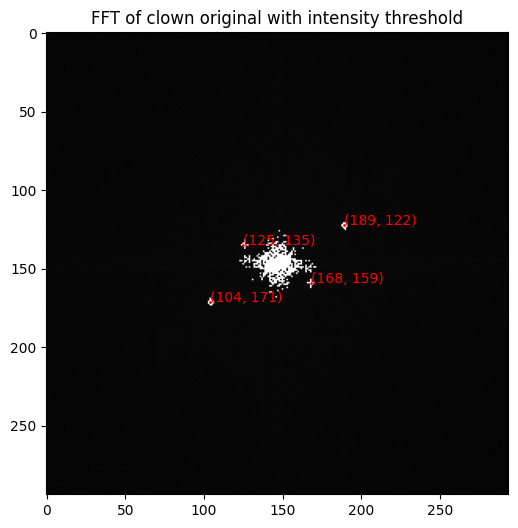

In [53]:
plt.figure(figsize=(6, 6))
plt.imshow(image_fft_logged_thresholded, cmap='gray')
plt.title('FFT of clown original with intensity threshold')

# points
plt.plot(104, 171, marker='o', markersize=1, color='red')
plt.plot(189, 122, marker='o', markersize=1, color='red')
plt.plot(168, 159, marker='o', markersize=1, color='red')
plt.plot(125, 135, marker='o', markersize=1, color='red')

# text labels
plt.text(104, 171, '(104, 171)', color='red')
plt.text(189, 122, '(189, 122)', color='red')
plt.text(168, 159, '(168, 159)', color='red')
plt.text(125, 135, '(125, 135)', color='red')

plt.show()

In [54]:
def calculate_distance(x1, y1, x2, y2):
  return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

center_x = image.shape[0]//2
center_y = image.shape[1]//2

points = [(104, 171), (189, 122), (168, 159), (125, 135)]

for point in points:
  x, y = point
  distance = calculate_distance(center_x, center_y, x, y)
  print(f"Distance from center ({center_x}, {center_y}) to point ({x}, {y}): {distance}")

Distance from center (147, 147) to point (104, 171): 49.24428900898052
Distance from center (147, 147) to point (189, 122): 48.877397639399746
Distance from center (147, 147) to point (168, 159): 24.186773244895647
Distance from center (147, 147) to point (125, 135): 25.059928172283335


Se hallan las coordenadas de las interferencias, resultando en una de aproximadamente frecuencia 50 y otra de frecuencia 25, desfasadas 90°.

In [55]:
def nullify_radius(spec_img, points, radius, threshold=1e-3):
    for point in points:
        x, y = point
        for dx in range(-radius, radius + 1):
            for dy in range(-radius, radius + 1):
                if np.sqrt(dx**2 + dy**2) <= radius:
                    spec_img[x + dx, y + dy] = threshold
                    spec_img[-(x + dx), -(y + dy)] = threshold  # simetría conjugada

Se decide anular estos puntos sobre el espectro de la señal original, en lo que viene a ser un **filtro notch**. Se aplica en un radio de 6 pixeles, valor obtenido empíricamente.

In [56]:
points = [(135, 125), (171, 104)]

modified_fft = np.fft.fft2(image)
spec_img = np.fft.fftshift(modified_fft)

# notch de "radio" 6 en cada punto
nullify_radius(spec_img, points, radius=6)

modified_image = np.fft.ifft2(np.fft.ifftshift(spec_img)).real
modified_image_fft = np.fft.fft2(modified_image)

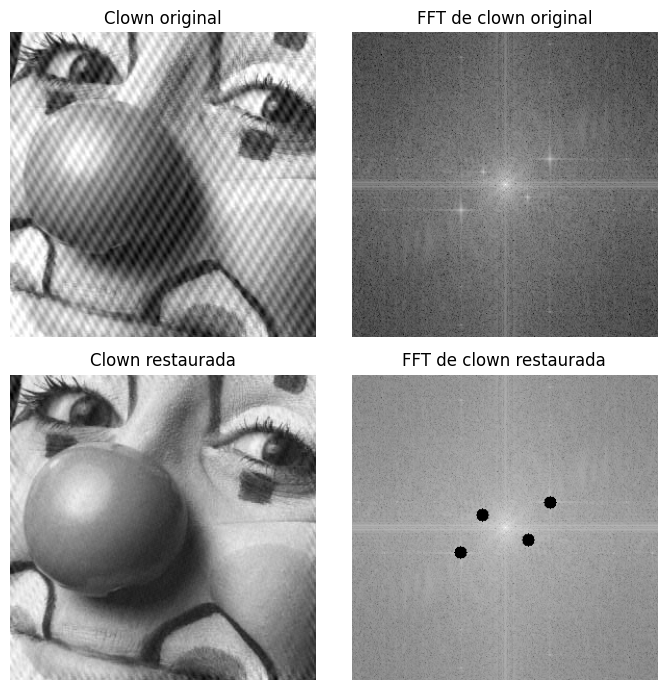

In [57]:
fig, axs = plt.subplots(2, 2, figsize=(7, 7))


# original
axs[0, 0].imshow(image, cmap='gray')
axs[0, 0].set_title('Clown original')
axs[0, 0].axis('off')

axs[0, 1].imshow(image_fft_logged, cmap='gray')
axs[0, 1].set_title('FFT de clown original')
axs[0, 1].axis('off')


# restaurada
axs[1, 0].imshow(modified_image, cmap='gray')
axs[1, 0].set_title('Clown restaurada')
axs[1, 0].axis('off')

axs[1, 1].imshow(np.log(np.abs(np.fft.fftshift(modified_image_fft))), cmap='gray')
axs[1, 1].set_title('FFT de clown restaurada')
axs[1, 1].axis('off')


plt.tight_layout()
plt.show()

In [58]:
MSE_restored = np.mean((image - modified_image) ** 2)
print('MSE (restaurada) = ' + str(MSE_restored))

MSE (restaurada) = 278.2818561392396


Aplicando la cancelación de la interferencias, se observa un buen grado de restaración, notándose aún así vestigios de la interferencia sobre los bordes, dado que la cancelación aplicada es grosera, no anulando completamente las perturbaciones.